# Identification of breast cancer from histopathological images using Image Classification

## Background

Breast cancer originates in the breast tissue, where abnormal cells grow uncontrollably to form tumors. If untreated, these tumors can spread and become fatal. This cancer can affect both men and women, though it is more common in women, typically starting in the lobules, ducts, or connective tissue. When the cancer spreads outside the breast, it is termed metastatic.

Breast cancer is the most commonly diagnosed cancer worldwide, with 2.26 million cases recorded in 2020, and is the leading cause of cancer mortality among females. Historically more prevalent in developed countries, over half of diagnoses and two-thirds of deaths now occur in less developed regions due to population aging and the adoption of high-risk lifestyles in low- and middle-income countries (LMICs).

In LMICs, such as many sub-Saharan African countries, breast cancer has a higher mortality rate due to late-stage presentation, limited healthcare infrastructure, high costs, unavailability of cancer services, and low patient awareness. In Kenya, breast cancer accounts for 16.1% of all cancers, with 6,799 new cases diagnosed in 2020, up from 5,985 in 2018. Deaths also increased from 2,553 in 2018 to 3,107 in 2020, making it the second-leading cause of cancer deaths. The disease predominantly affects women aged 35 to 45, with 68% of cases diagnosed at late stages, resulting in low survival rates.

Early detection and timely treatment significantly improve survival rates. However, most patients in Kenya present with advanced disease, highlighting the need for better screening programs. Traditional diagnostic methods involve manual examination of histopathological images by pathologists, which is time-consuming, prone to human error, and limited by the availability of specialized professionals.

Leveraging machine learning for classifying histopathological images can enhance diagnostic accuracy, reduce the workload of medical professionals, and improve patient outcomes by enabling earlier and more accurate detection of breast cancer. Adopting advanced technologies in healthcare systems in Kenya and other LMICs can significantly improve breast cancer diagnosis and treatment, ultimately saving more lives. The integration of machine learning in medical diagnostics represents a promising advancement to address the challenges faced by healthcare providers in these regions.

## Study questions

1. How accurately can machine learning models classify benign and malignant breast tumor histopathological images?
2. Which machine learning algorithms yield the highest accuracy in classifying breast cancer images?
3. What are the key challenges in using machine learning for breast cancer histopathological image classification?
4. How can machine learning improve the diagnostic process for breast cancer in low- and middle-income countries?

## Primary objectives

1.	Develop a Robust Image Classification Model
Create a machine learning model capable of accurately distinguishing between benign and malignant breast tumor histopathological images.
2.	Enhance Diagnostic Accuracy
Improve the accuracy of breast cancer diagnoses through automated analysis, reducing the rate of false positives and negatives.

## Secondary objectives

1.	Evaluate Machine Learning Algorithms
Compare the performance of various machine learning algorithms (e.g., Convolutional Neural Networks, Support Vector Machines) to identify which yields the highest accuracy in classifying breast cancer images.
2.	Improve Early Detection Rates
Facilitate earlier detection of breast cancer by providing a reliable tool for regular screening, leading to better patient outcomes.
3.	Develop a Cost-Effective Diagnostic Tool
Create an affordable and accessible diagnostic tool that can be used in resource-limited settings, contributing to healthcare equity.

## Data understanding
We sourced our data from the Breast Cancer Histopathological Image Classification (BreakHis) database, which contains 9,104 microscopic images of breast tumor tissue, including 2,480 benign and 5,429 malignant samples. In the Kenyan Context, most machines used in cancer detection are light microscopes which can focus images at either 40X magnification or 100X magnification. We opted top focus on these magnification inour model. Each image file name stores essential information such as the method of procedure biopsy, tumor class (benign or malignant), tumor type, patient identification, and magnification factor. This dataset, developed in collaboration with the P&D Laboratory in Parana, Brazil, provides a valuable tool for benchmarking and evaluating breast cancer image classification models.

## Data preparation

1.	Data Cleaning and Preprocessing:

•	Image Normalization: Converting all images to a standard size and resolution to ensure uniformity improving model performance
•	Data Augmentation: Applying techniques such as rotation, flipping, scaling, and cropping to artificially increase the size of the dataset.
•	Handling Missing or Corrupted Data: Identify and handle any corrupted or incomplete image files. Images with errors will be removed or repaired if possible.
•	Ensure Accurate Labels: Double-check that all annotations (benign or malignant) are accurate and consistently applied

2.	Data Splitting:

•	Training, Validation, and Test Sets: Divide the dataset into training, validation, and test sets ensuring that the distribution of benign and malignant samples is balanced across these sets to avoid bias.

**Modelling**

For this project, we will test a variety of models to identify the best approach for classifying breast cancer histopathological images. We will use Convolutional Neural Networks (CNNs) and explore Support Vector Machines (SVMs), as well as classical machine learning models like K-Nearest Neighbors (KNN) and Random Forests. Additionally, we will consider Gradient Boosting Machines such as XGBoost or LightGBM.
In the training procedure, we will train the selected models using the training dataset while monitoring their progress through loss and accuracy metrics to ensure effective learning. Model performance will be evaluated on the validation set to fine-tune hyperparameters and prevent overfitting, using metrics such as accuracy, precision, recall, and F1-score. We will also implement k-fold cross-validation to ensure consistent performance across different subsets of the data, aiding in better generalization to unseen data.
To prevent overfitting and enhance generalization, we will apply regularization techniques such as dropout, L2 regularization, and data augmentation. Furthermore, grid search or random search will be utilized to optimize hyperparameters, including learning rates, batch sizes, and network architectures, to identify the best configuration for our models.

## Evaluation

1.	Performance metrics

•	Accuracy: Measure the overall percentage of correctly classified images.
•	Precision and Recall: Calculate precision (the ratio of true positives to the sum of true and false positives) and recall (the ratio of true positives to the sum of true positives and false negatives) to assess the model’s ability to correctly identify benign and malignant tumors.
•	F1-Score: Compute the F1-score to balance the trade-off between false positives and false negatives.
•	Confusion Matrix: Analyze the confusion matrix to visualize the classification performance and identify types of errors

2.	Model comparison

* Compare the performance of different machine learning algorithms using evaluation metrics.
* Determine which algorithm provides the highest accuracy and best generalization on the test dataset.
Deployment

**Results reporting**

•	Provide a detailed report and presentations showcasing model architecture, performance and potential impact.

•	Measure the time required for the model to make predictions on new images to ensure it meets the operational requirements.

## DATA LOADING

In [1]:
!pip install tensorflow tensorflow-gpu opencv-python matplotlib

  Using cached tensorflow-gpu-2.12.0.tar.gz (2.6 kB)
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [2]:
import tensorflow as tf

In [3]:
# This code configures TensorFlow to use GPU devices efficiently by enabling dynamic memory allocation,
# preventing it from allocating all GPU memory at once.
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

In [4]:
gpus

[]

In [5]:
# Importing all necessary libraries

import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
import cv2
import imghdr
import zipfile
import os
from PIL import Image
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.manifold import MDS
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import pairwise_distances

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

In [6]:
# Mounting the drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
! pip install Pillow

In [8]:
# Define the base data directory
data_dir = '/content/drive/MyDrive/consolidated_images'

# List of image extensions to consider
image_exts = ['jpeg', 'jpg', 'bmp', 'png']

# Contents of the main data directory
print("Contents of the main data directory:")
print(os.listdir(data_dir))  # List all items in the base directory

# Contents of the 'benign' subdirectory
print("\nContents of the 'benign' subdirectory:")
print(os.listdir(os.path.join(data_dir, 'benign')))  # List all items in the 'benign' subdirectory

# Contents of the 'malignant' subdirectory
print("\nContents of the 'malignant' subdirectory:")
print(os.listdir(os.path.join(data_dir, 'malignant')))  # List all items in the 'malignant' subdirectory


Contents of the main data directory:
['benign', 'malignant']

Contents of the 'benign' subdirectory:
['phyllodes_tumor', 'tubular_adenoma', 'fibroadenoma', 'adenosis']

Contents of the 'malignant' subdirectory:
['papillary_carcinoma', 'ductal_carcinoma', 'lobular_carcinoma', 'mucinous_carcinoma']


In [9]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Data understanding and preview

array([[[142, 148, 153],
        [144, 150, 155],
        [144, 148, 153],
        ...,
        [185, 187, 187],
        [177, 179, 179],
        [175, 175, 175]],

       [[137, 146, 150],
        [147, 155, 162],
        [140, 146, 153],
        ...,
        [196, 201, 200],
        [181, 186, 185],
        [169, 171, 172]],

       [[130, 142, 144],
        [148, 157, 161],
        [141, 149, 156],
        ...,
        [185, 190, 193],
        [165, 171, 176],
        [168, 171, 179]],

       ...,

       [[133, 127, 138],
        [116, 111, 120],
        [112, 104, 114],
        ...,
        [ 19,   4,  18],
        [ 51,  38,  52],
        [132, 123, 133]],

       [[149, 144, 153],
        [122, 115, 122],
        [113, 105, 112],
        ...,
        [ 30,  16,  27],
        [ 60,  49,  59],
        [124, 116, 123]],

       [[180, 176, 182],
        [167, 159, 166],
        [162, 151, 159],
        ...,
        [ 32,  17,  25],
        [ 60,  49,  57],
        [149, 141, 148]]], dtype=uint8)
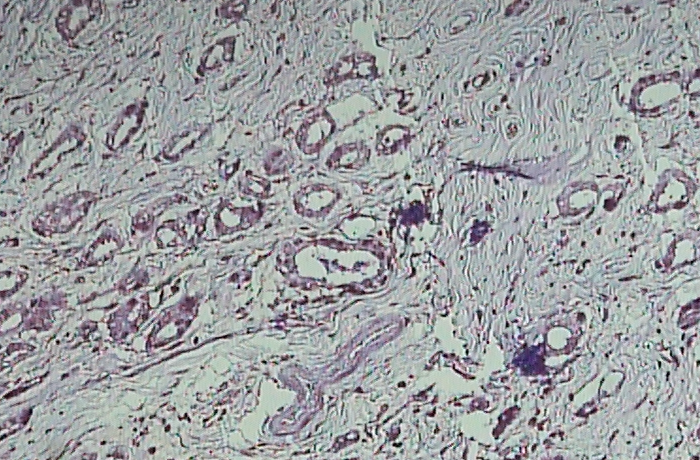

In [10]:
# opening one image to confirm correct loading
cv2_img= cv2.imread(os.path.join(data_dir, 'benign', 'tubular_adenoma', 'SOB_B_TA-14-13200-100-001.png'))
cv2_img

The image is 460 pixels high, 700 pixels wide and has 3 channels meaning its a coloured image

In [11]:
# Define subfolders for benign and malignant categories
benign_subfolders = ['tubular_adenoma', 'fibroadenoma', 'adenosis', 'phyllodes_tumor']
malignant_subfolders = ['papillary_carcinoma', 'mucinous_carcinoma', 'lobular_carcinoma', 'ductal_carcinoma']

# Iterate through each benign subfolder
for subfolder in benign_subfolders:

    # Construct the path to the current benign subfolder
    subfolder_path = os.path.join(data_dir, 'benign', subfolder)

    # List all images in the current benign subfolder
    images = os.listdir(subfolder_path)

    # Print the list of images for the current benign subfolder
    print(f'Images in benign/{subfolder}:', images)

# Iterate through each malignant subfolder
for subfolder in malignant_subfolders:

    # Construct the path to the current malignant subfolder
    subfolder_path = os.path.join(data_dir, 'malignant', subfolder)

    # List all images in the current malignant subfolder
    images = os.listdir(subfolder_path)

    # Print the list of images for the current malignant subfolder
    print(f'Images in malignant/{subfolder}:', images)


Images in benign/tubular_adenoma: ['SOB_B_TA-14-16184-100-002.png', 'SOB_B_TA-14-16184CD-100-002.png', 'SOB_B_TA-14-16184CD-100-003.png', 'SOB_B_TA-14-16184CD-100-001.png', 'SOB_B_TA-14-16184CD-100-005.png', 'SOB_B_TA-14-16184CD-100-008.png', 'SOB_B_TA-14-16184CD-100-006.png', 'SOB_B_TA-14-16184CD-100-004.png', 'SOB_B_TA-14-16184CD-100-007.png', 'SOB_B_TA-14-16184CD-100-010.png', 'SOB_B_TA-14-16184CD-100-015.png', 'SOB_B_TA-14-16184CD-100-016.png', 'SOB_B_TA-14-16184CD-100-009.png', 'SOB_B_TA-14-16184CD-100-014.png', 'SOB_B_TA-14-16184CD-100-012.png', 'SOB_B_TA-14-16184CD-100-011.png', 'SOB_B_TA-14-16184CD-100-013.png', 'SOB_B_TA-14-16184CD-100-021.png', 'SOB_B_TA-14-16184CD-100-025.png', 'SOB_B_TA-14-16184CD-100-022.png', 'SOB_B_TA-14-16184CD-100-023.png', 'SOB_B_TA-14-16184CD-100-024.png', 'SOB_B_TA-14-16184CD-100-019.png', 'SOB_B_TA-14-16184CD-100-017.png', 'SOB_B_TA-14-16184CD-100-020.png', 'SOB_B_TA-14-16184CD-100-018.png', 'SOB_B_TA-14-16184CD-100-028.png', 'SOB_B_TA-14-16184CD-1

In [12]:
data_dir = '/content/drive/MyDrive/consolidated_images'
benign_subfolders = ['tubular_adenoma', 'fibroadenoma', 'adenosis', 'phyllodes_tumor']
malignant_subfolders = ['papillary_carcinoma', 'mucinous_carcinoma', 'lobular_carcinoma', 'ductal_carcinoma']


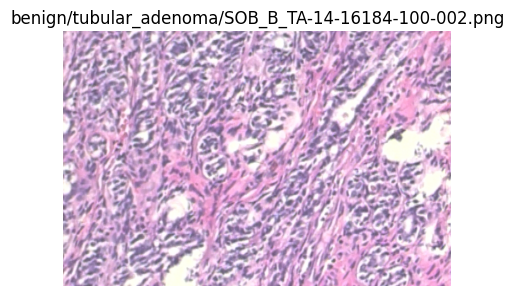

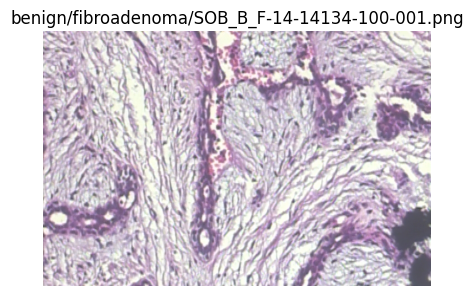

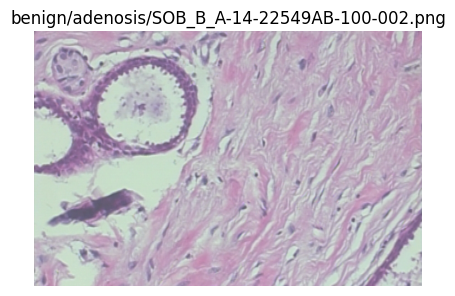

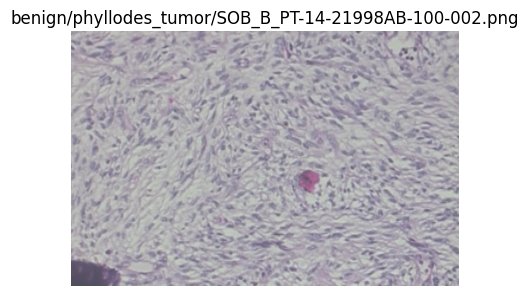

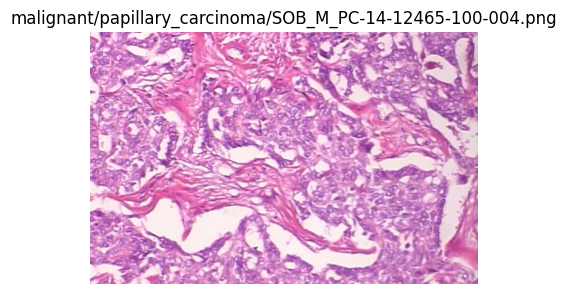

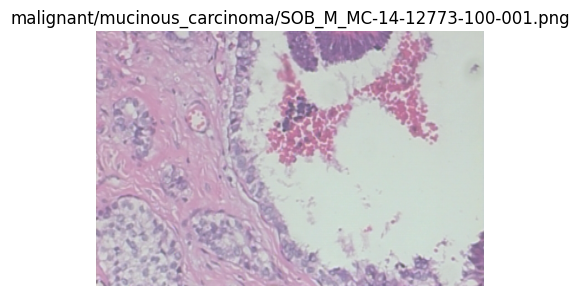

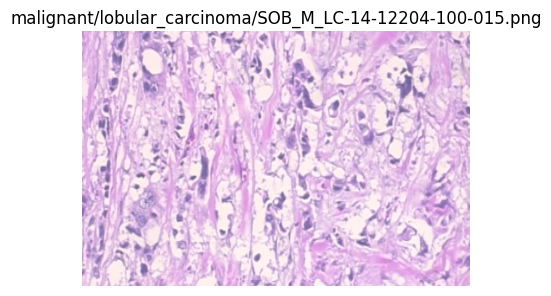

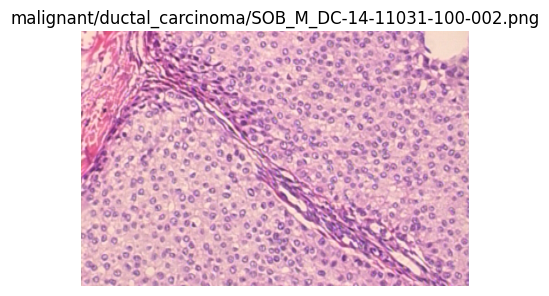

In [13]:
# Function to display images from specified subfolders

def display_images(base_dir, class_name, subfolders, num_images=1):

    # Iterate through each subfolder
    for subfolder in subfolders:
        subfolder_path = os.path.join(base_dir, class_name, subfolder)
        images = os.listdir(subfolder_path)[:num_images]
        for img_name in images:
            img_path = os.path.join(subfolder_path, img_name)

            # Read and display the image
            img = plt.imread(img_path)
            plt.figure(figsize=(5, 5))
            plt.imshow(img)
            plt.title(f'{class_name}/{subfolder}/{img_name}')
            plt.axis('off')
            plt.show()

# Display images from benign categories
display_images(data_dir, 'benign', benign_subfolders)

# Display images from malignant categories
display_images(data_dir, 'malignant', malignant_subfolders)



In [14]:
def count_images(data_dir, class_name, subfolders):
    """
    Counts and displays the number of images in each subfolder.

    Args:
        base_dir (str): The base directory containing the subfolders.
        class_name (str): The name of the class (e.g., 'benign', 'malignant').
        subfolders (list): A list of subfolder names.
    """
    for subfolder in subfolders:
        # Use the current subfolder in the path construction
        subfolder_path = os.path.join(data_dir,class_name, subfolder)
        num_images = len(os.listdir(subfolder_path))
        print(f"Number of images in {class_name}/{subfolder}: {num_images}")

# Count and display the number of images in each benign subfolder
count_images(data_dir, 'benign', benign_subfolders)

# Count and display the number of images in each malignant subfolder
count_images(data_dir, 'malignant', malignant_subfolders)

Number of images in benign/tubular_adenoma: 117
Number of images in benign/fibroadenoma: 260
Number of images in benign/adenosis: 113
Number of images in benign/phyllodes_tumor: 121
Number of images in malignant/papillary_carcinoma: 142
Number of images in malignant/mucinous_carcinoma: 222
Number of images in malignant/lobular_carcinoma: 170
Number of images in malignant/ductal_carcinoma: 883


In [15]:
import os
import pandas as pd

def count_images(base_dir, class_name, subfolders):
    image_counts = []
    print(f"Image count for {class_name}:")
    for subfolder in subfolders:
        # Construct the full path to the subfolder
        subfolder_path = os.path.join(base_dir, class_name, subfolder)

        # Check if the subfolder exists
        if os.path.exists(subfolder_path) and os.path.isdir(subfolder_path):
            # Get the list of files in the subfolder
            num_images = len(os.listdir(subfolder_path))
            image_counts.append([class_name, subfolder, num_images])
            print(f"  {subfolder}: {num_images} images")
        else:
            print(f"  {subfolder}: Subfolder does not exist")
            image_counts.append([class_name, subfolder, 0])

    return image_counts

# Define the base data directory
data_dir = '/content/drive/MyDrive/consolidated_images'

# Define the subfolders for each class
benign_subfolders = ['tubular_adenoma', 'fibroadenoma', 'adenosis', 'phyllodes_tumor']
malignant_subfolders = ['papillary_carcinoma', 'mucinous_carcinoma', 'lobular_carcinoma', 'ductal_carcinoma']

# Count images in benign and malignant subfolders
benign_counts = count_images(data_dir, 'benign', benign_subfolders)  # Call the function and store the result
malignant_counts = count_images(data_dir, 'malignant', malignant_subfolders)  # Call the function and store the result

# Combine the counts into a single list
all_counts = benign_counts + malignant_counts

# Create a DataFrame from the counts
df = pd.DataFrame(all_counts, columns=['Class', 'Subfolder', 'Number of Images'])

# Display the DataFrame
print(df)

Image count for benign:
  tubular_adenoma: 117 images
  fibroadenoma: 260 images
  adenosis: 113 images
  phyllodes_tumor: 121 images
Image count for malignant:
  papillary_carcinoma: 142 images
  mucinous_carcinoma: 222 images
  lobular_carcinoma: 170 images
  ductal_carcinoma: 883 images
       Class            Subfolder  Number of Images
0     benign      tubular_adenoma               117
1     benign         fibroadenoma               260
2     benign             adenosis               113
3     benign      phyllodes_tumor               121
4  malignant  papillary_carcinoma               142
5  malignant   mucinous_carcinoma               222
6  malignant    lobular_carcinoma               170
7  malignant     ductal_carcinoma               883


In [16]:
# Initialize a list to store image metadata
image_data = []

# Function to extract image data from subfolders
def extract_image_data(base_dir, class_name, subfolders):
    for subfolder in subfolders:
        subfolder_path = os.path.join(base_dir, class_name, subfolder)
        if os.path.exists(subfolder_path) and os.path.isdir(subfolder_path):
            for file in os.listdir(subfolder_path):
                if any(file.lower().endswith(ext) for ext in image_exts):
                    file_path = os.path.join(subfolder_path, file)

                    img = cv2.imread(file_path)
                    if img is not None:
                        height, width, channels = img.shape
                        image_data.append({
                            'File Path': file_path,
                            'Category': class_name,
                            'Subcategory': subfolder,
                            'Width': width,
                            'Height': height,
                            'Channels': channels
                        })

# Define subfolders for benign and malignant categories
benign_subfolders = ['tubular_adenoma', 'fibroadenoma', 'adenosis', 'phyllodes_tumor']
malignant_subfolders = ['papillary_carcinoma', 'mucinous_carcinoma', 'lobular_carcinoma', 'ductal_carcinoma']

# Extract data for benign and malignant categories
extract_image_data(data_dir, 'benign', benign_subfolders)
extract_image_data(data_dir, 'malignant', malignant_subfolders)

# Create a DataFrame from the image metadata
df_data = pd.DataFrame(image_data)

# Display the first few rows of the DataFrame
print (df_data.head())
print (df_data.tail())

# Display keys
df_data.keys()


                                           File Path Category  \
0  /content/drive/MyDrive/consolidated_images/ben...   benign   
1  /content/drive/MyDrive/consolidated_images/ben...   benign   
2  /content/drive/MyDrive/consolidated_images/ben...   benign   
3  /content/drive/MyDrive/consolidated_images/ben...   benign   
4  /content/drive/MyDrive/consolidated_images/ben...   benign   

       Subcategory  Width  Height  Channels  
0  tubular_adenoma    700     460         3  
1  tubular_adenoma    700     460         3  
2  tubular_adenoma    700     460         3  
3  tubular_adenoma    700     460         3  
4  tubular_adenoma    700     460         3  
                                              File Path   Category  \
2023  /content/drive/MyDrive/consolidated_images/mal...  malignant   
2024  /content/drive/MyDrive/consolidated_images/mal...  malignant   
2025  /content/drive/MyDrive/consolidated_images/mal...  malignant   
2026  /content/drive/MyDrive/consolidated_images/mal.

Index(['File Path', 'Category', 'Subcategory', 'Width', 'Height', 'Channels'], dtype='object')

In [17]:
df.head(8)

,Class,Subfolder,Number of Images
0,benign,tubular_adenoma,117
1,benign,fibroadenoma,260
2,benign,adenosis,113
3,benign,phyllodes_tumor,121
4,malignant,papillary_carcinoma,142
5,malignant,mucinous_carcinoma,222
6,malignant,lobular_carcinoma,170
7,malignant,ductal_carcinoma,883


In [18]:
# Check data types
print("Data types of columns:")
print(df.dtypes)



Data types of columns:
Class               object
Subfolder           object
Number of Images     int64
dtype: object


In [19]:
# Check for duplicate rows
duplicates = df.duplicated().sum()
print(f"Number of duplicate rows: {duplicates}")

# Remove duplicate rows
df = df.drop_duplicates()

print(f"Number of rows after removing duplicates: {len(df)}")

Number of duplicate rows: 0
Number of rows after removing duplicates: 8


In [20]:
# Check for missing values in the dataframe
missing_values = df.isnull().sum()
print("Missing values in each column:")
print(missing_values)

Missing values in each column:
Class               0
Subfolder           0
Number of Images    0
dtype: int64


In [21]:
# Calculate statistics for Width and Height
width_stats = df_data['Width'].describe()
height_stats = df_data['Height'].describe()
channels_stats = df_data['Channels'].describe()

print("Width Statistics:\n", width_stats)
print("\nHeight Statistics:\n", height_stats)
print("\nChannels Statistics:\n", channels_stats)

Width Statistics:
 count    2028.0
mean      700.0
std         0.0
min       700.0
25%       700.0
50%       700.0
75%       700.0
max       700.0
Name: Width, dtype: float64

Height Statistics:
 count    2028.000000
mean      459.958580
std         0.405026
min       456.000000
25%       460.000000
50%       460.000000
75%       460.000000
max       460.000000
Name: Height, dtype: float64

Channels Statistics:
 count    2028.0
mean        3.0
std         0.0
min         3.0
25%         3.0
50%         3.0
75%         3.0
max         3.0
Name: Channels, dtype: float64


## Exploratory Data Analysis

DISPLAY IMAGES

Displaying benign images:


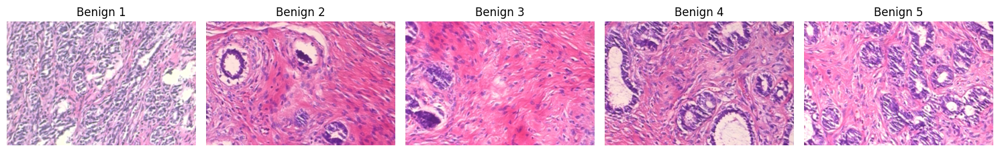

Displaying malignant images:


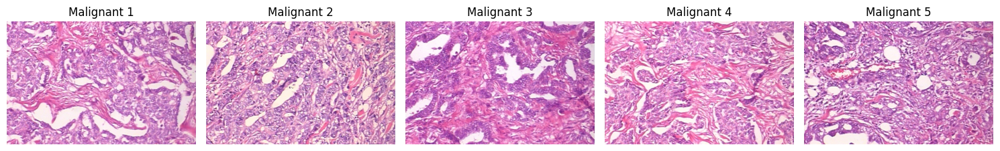

In [22]:
import matplotlib.pyplot as plt
from PIL import Image

# Function to display images in a grid
def display_images(images, titles, cols=5):
    rows = (len(images) + cols - 1) // cols  # Calculate number of rows needed
    plt.figure(figsize=(15, rows * 3))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.title(title)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Filter the DataFrame for 'benign' and 'malignant'
benign_df = df_data[df_data['Category'] == 'benign']
malignant_df = df_data[df_data['Category'] == 'malignant']

# Select 5 images from each category
benign_images = [Image.open(row['File Path']) for _, row in benign_df.head(5).iterrows()]
malignant_images = [Image.open(row['File Path']) for _, row in malignant_df.head(5).iterrows()]

# Titles for the images
benign_titles = [f"Benign {i+1}" for i in range(5)]
malignant_titles = [f"Malignant {i+1}" for i in range(5)]

# Display the images
print("Displaying benign images:")
display_images(benign_images, benign_titles)
print("Displaying malignant images:")
display_images(malignant_images, malignant_titles)


Class Distribution

<ipython-input-23-18ecf33522fc>:9: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='Class', y='Number of Images', data=class_counts, palette=palette, ci=None)
<ipython-input-23-18ecf33522fc>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Class', y='Number of Images', data=class_counts, palette=palette, ci=None)


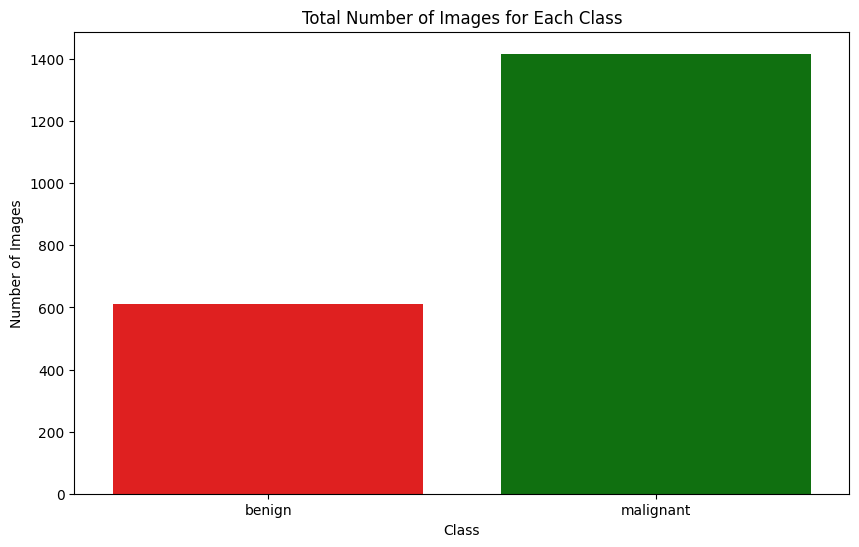

In [23]:
# Calculate the total number of images for each class
class_counts = df.groupby('Class')['Number of Images'].sum().reset_index()

# Define the color palette
palette = {'benign': 'red', 'malignant': 'green'}

# Plot the total number of images for each class
plt.figure(figsize=(10, 6))
sns.barplot(x='Class', y='Number of Images', data=class_counts, palette=palette, ci=None)
plt.title('Total Number of Images for Each Class')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.show()


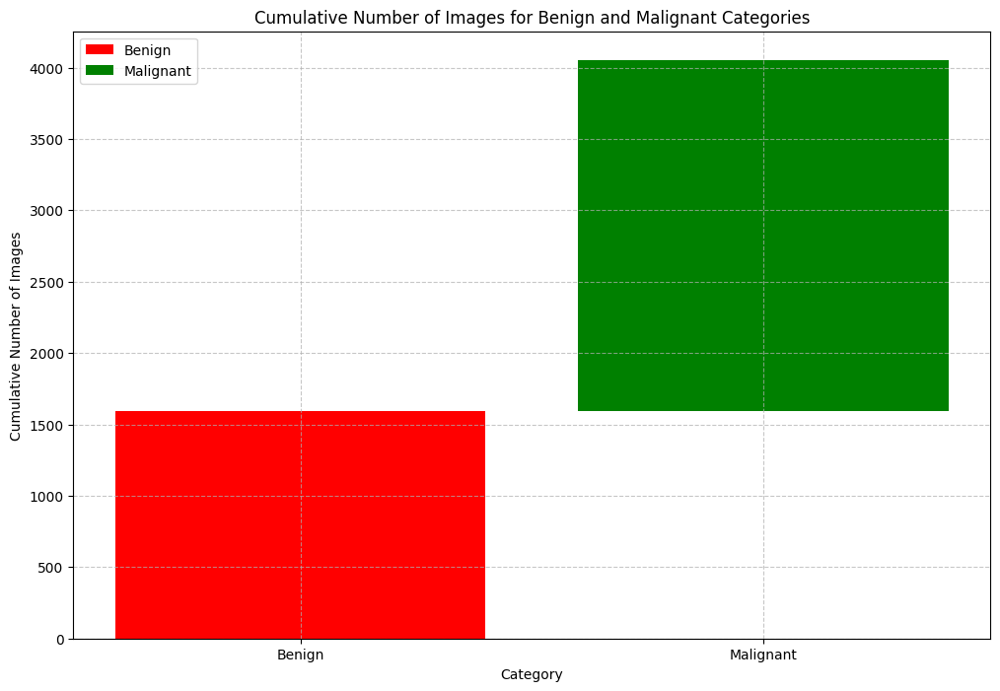

In [24]:
import matplotlib.pyplot as plt

# Calculate the cumulative sum of images for each class
df['Cumulative Sum'] = df.groupby('Class')['Number of Images'].cumsum()

# Aggregate the cumulative sums for benign and malignant
cumulative_benign = df[df['Class'] == 'benign']['Cumulative Sum'].sum()
cumulative_malignant = df[df['Class'] == 'malignant']['Cumulative Sum'].sum()

# Plotting
plt.figure(figsize=(12, 8))

# Plot benign
plt.bar('Benign', cumulative_benign, color='red', label='Benign')

# Plot malignant on top of benign
plt.bar('Malignant', cumulative_malignant, bottom=cumulative_benign, color='green', label='Malignant')

# Customize plot
plt.title('Cumulative Number of Images for Benign and Malignant Categories')
plt.xlabel('Category')
plt.ylabel('Cumulative Number of Images')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

# Show plot
plt.show()


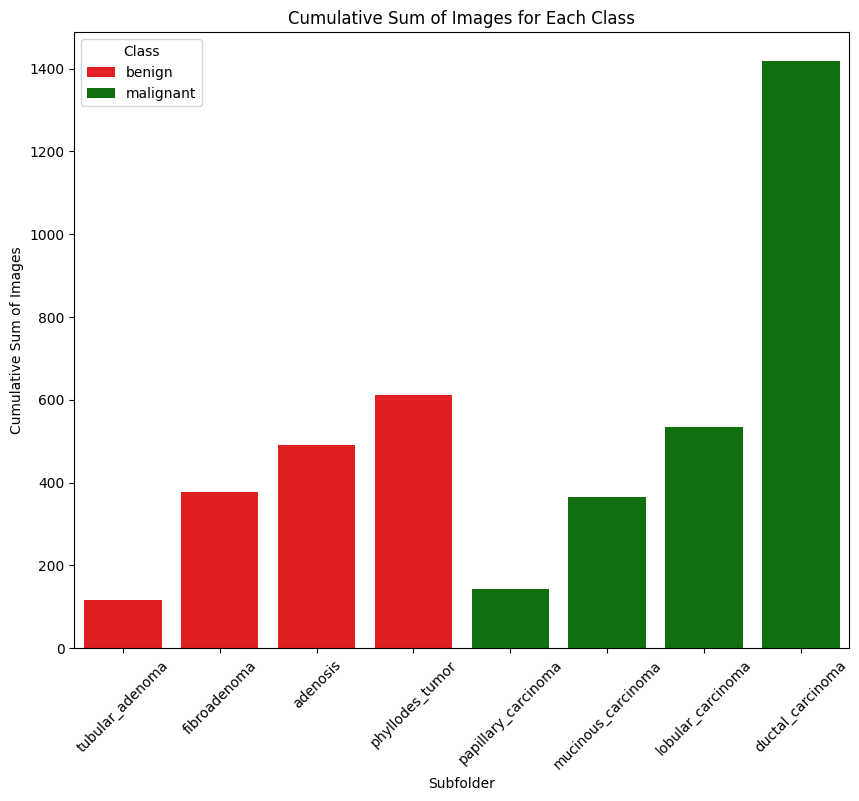

In [25]:
# Calculate the cumulative sum of images for each class
df['Cumulative Sum'] = df.groupby('Class')['Number of Images'].cumsum()

# Create a color palette for the bar plot
palette = {'benign': 'red', 'malignant': 'green'}

# Plot the cumulative sum of images for each class
plt.figure(figsize=(10, 8))
sns.barplot(data=df, x='Subfolder', y='Cumulative Sum', hue='Class', palette=palette)

plt.title('Cumulative Sum of Images for Each Class')
plt.xlabel('Subfolder')
plt.ylabel('Cumulative Sum of Images')
plt.xticks(rotation=45)
plt.show()


The above visualizations illustrate a class imbalance between benign and malignant categories.

Counts by subcategory

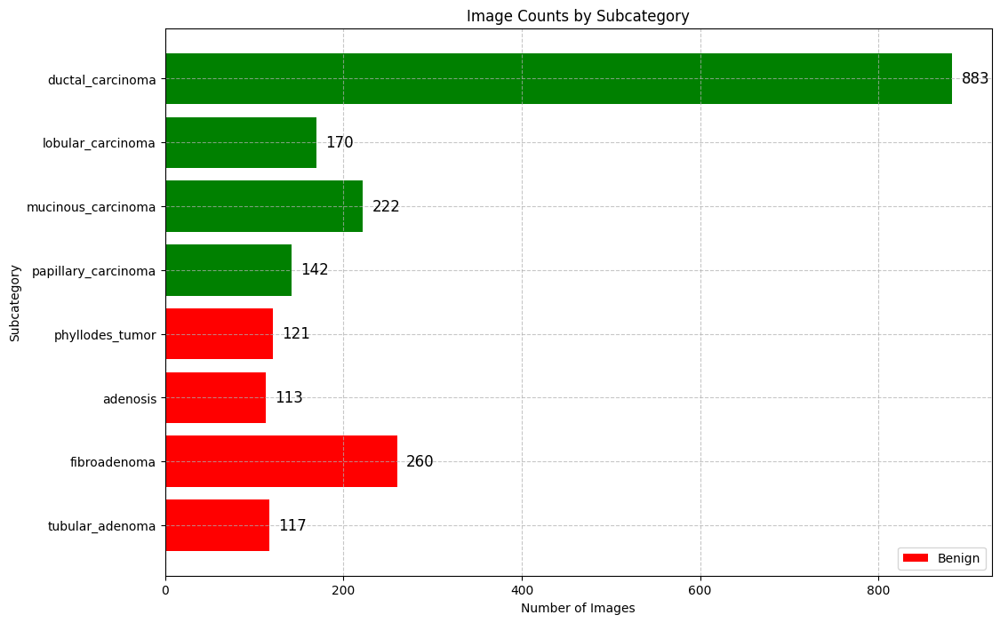

In [26]:
# Create a figure and axis with increased size
plt.figure(figsize=(12, 8))  # Adjust figure size as needed

# Plot horizontal bar chart with specific colors for benign and malignant
colors = df['Class'].map({'benign': 'red', 'malignant': 'green'})
bars = plt.barh(df['Subfolder'], df['Number of Images'], color=colors)

# Add labels on the bars
for bar in bars:
    width = bar.get_width()
    plt.text(width + 10, bar.get_y() + bar.get_height() / 2, f'{width}',
             va='center', ha='left', fontsize=12, color='black')

# Customize plot
plt.title('Image Counts by Subcategory')
plt.xlabel('Number of Images')
plt.ylabel('Subcategory')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(['Benign', 'Malignant'])
plt.show()

Image size distribution

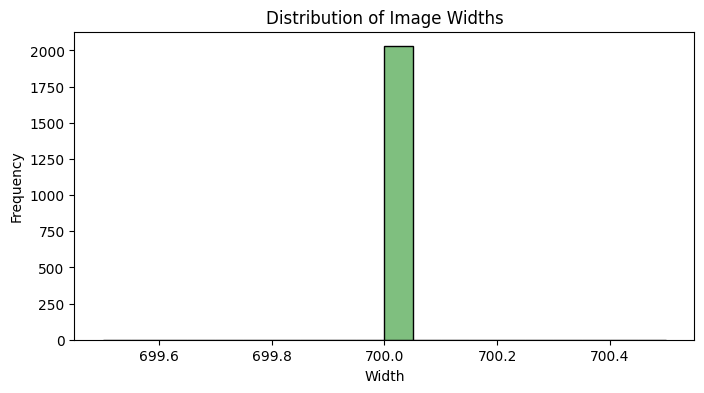

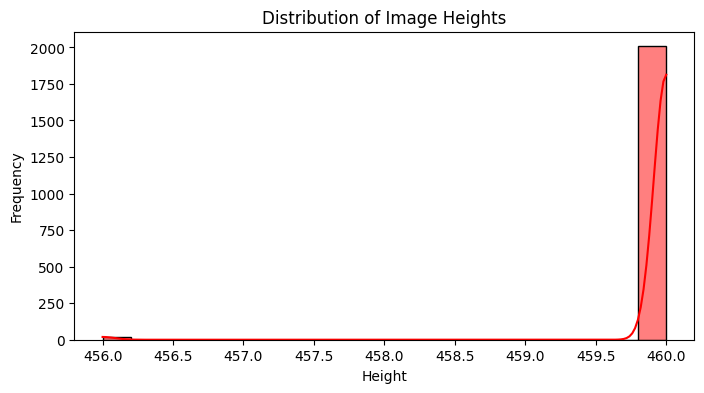

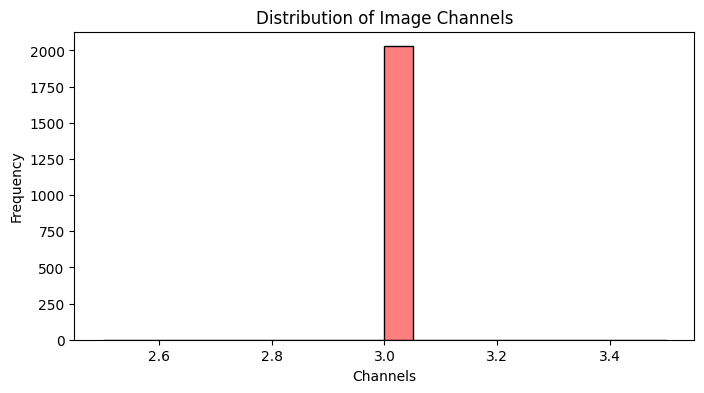

In [27]:
# Plot distribution of image widths
plt.figure(figsize=(8, 4))
sns.histplot(df_data['Width'], kde=True, bins=20, color='green')
plt.title('Distribution of Image Widths')
plt.xlabel('Width')
plt.ylabel('Frequency')
plt.show()

# Plot distribution of image heights
plt.figure(figsize=(8, 4))
sns.histplot(df_data['Height'], kde=True, bins=20, color='red')
plt.title('Distribution of Image Heights')
plt.xlabel('Height')
plt.ylabel('Frequency')
plt.show()

# Plot distribution of channels
plt.figure(figsize=(8, 4))
sns.histplot(df_data['Channels'], kde=True, bins=20, color='red')
plt.title('Distribution of Image Channels')
plt.xlabel('Channels')
plt.ylabel('Frequency')
plt.show()


The above visualizations reveal that all images have the same width while their heights vary, with a majority of images having one specific height.

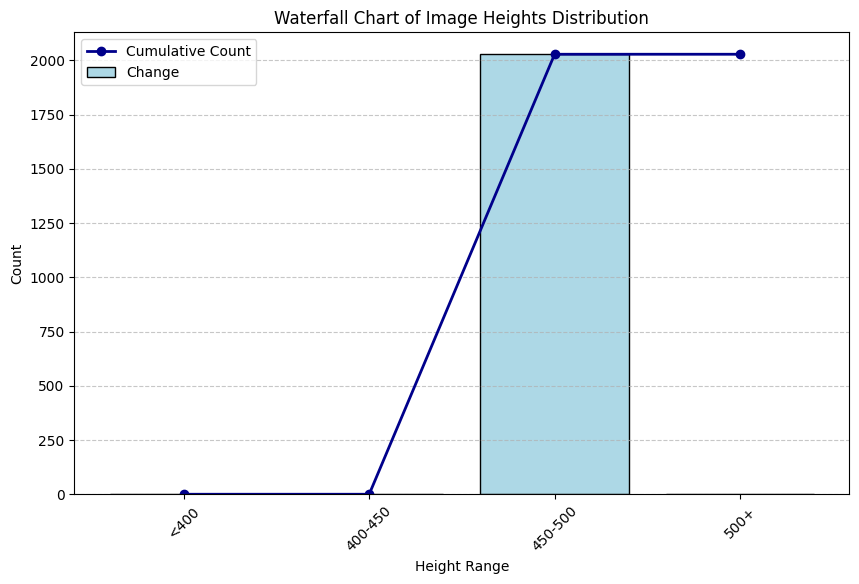

In [28]:
# cumulative distribution of image heights

# Create bins for heights
bins = [0, 400, 450, 500, 550]
labels = ['<400', '400-450', '450-500', '500+']
df_data['Height Binned'] = pd.cut(df_data['Height'], bins=bins, labels=labels, right=False)

# Count the frequency of each bin
height_counts = df_data['Height Binned'].value_counts().sort_index()

# Prepare data for waterfall chart
waterfall_data = height_counts.cumsum().reset_index()
waterfall_data.columns = ['Height Range', 'Cumulative Count']
waterfall_data['Start'] = waterfall_data['Cumulative Count'].shift(1, fill_value=0)
waterfall_data['Change'] = waterfall_data['Cumulative Count'] - waterfall_data['Start']

# Plot the waterfall chart
plt.figure(figsize=(10, 6))
plt.bar(waterfall_data['Height Range'], waterfall_data['Change'], color='lightblue', edgecolor='black', label='Change')
plt.plot(waterfall_data['Height Range'], waterfall_data['Cumulative Count'], marker='o', color='darkblue', linestyle='-', linewidth=2, label='Cumulative Count')

# Add labels and title
plt.xlabel('Height Range')
plt.ylabel('Count')
plt.title('Waterfall Chart of Image Heights Distribution')
plt.xticks(rotation=45)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.show()

t-SNE Visualization

Visualizing high-dimensional image features in a lower-dimensional space using t-SNE (t-Distributed Stochastic Neighbor Embedding)

In [29]:
pip install opencv-python numpy


In [30]:
from sklearn.manifold import TSNE

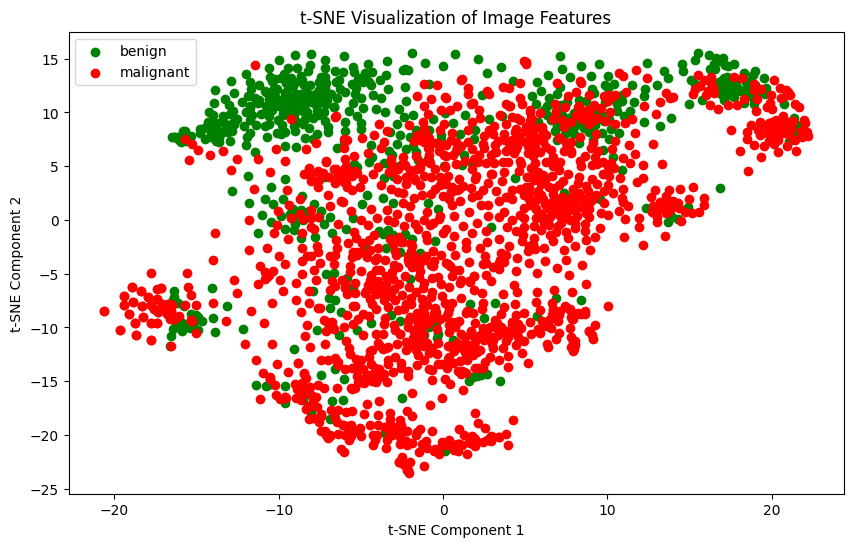

In [31]:
# Extract image features (e.g., resize and flatten the images)
def extract_features(image, size=(64, 64)):
    image = image.resize(size)
    return np.array(image).flatten()

features = []
labels = []

# Assuming df_data has columns 'File Path' and 'Category'
for index, row in df_data.iterrows():
    img = Image.open(row['File Path'])
    features.append(extract_features(img))
    labels.append(row['Category'])

features = np.array(features)
labels = np.array(labels)

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(features)

# Plot the t-SNE results
plt.figure(figsize=(10, 6))
colors = {'benign': 'green', 'malignant': 'red'}

for category in np.unique(labels):
    idx = labels == category
    plt.scatter(features_tsne[idx, 0], features_tsne[idx, 1], label=category, color=colors[category])

plt.title("t-SNE Visualization of Image Features")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.legend()
plt.show()


This identifies clusters & patterns in the data: images from the same category tend to cluster together, indicate that the features are effective in capturing the underlying structure of the data. The graph reveal how different categories are related to each other in the feature space. This allows us to visualize the similarities and differences between images based on their extracted features in a 2D space, making it easier to understand the structure of the data.

From this we can see that:

**Outliers**- Points that are far away from the main clusters indicate unusual or outlier images.

**Class imbalance** - presence of imbalance with one category having higher data representation (malignant)

IMAGE INTENSITY DISTRIBUTION

<ipython-input-32-17f46b81c3ef>:18: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(intensities, label=class_name, shade=True)
<ipython-input-32-17f46b81c3ef>:18: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(intensities, label=class_name, shade=True)


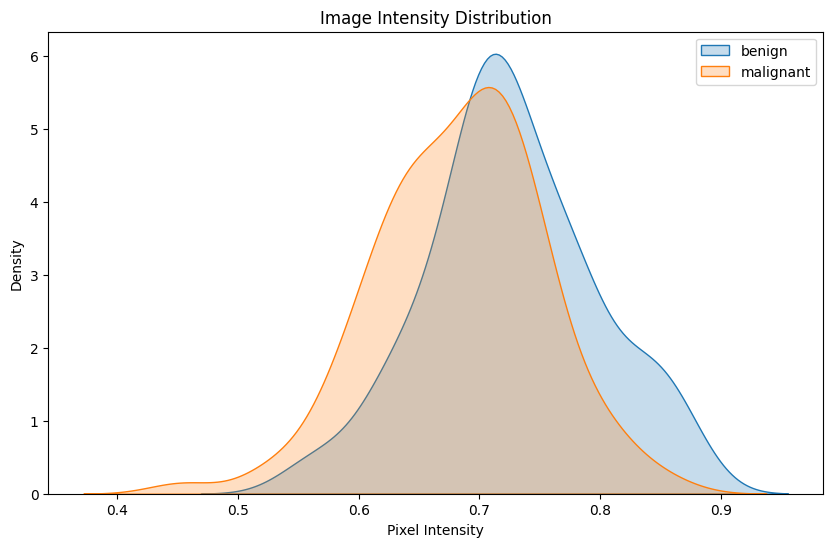

In [32]:
# Function to calculate and plot intensity distribution from DataFrame
def plot_intensity_distribution(df_data, class_names, num_samples=100):
    plt.figure(figsize=(10, 6))
    for class_name in class_names:
        # Filter data for the specific class
        class_df = df_data[df_data['Category'] == class_name]

        # Sample up to num_samples images
        sampled_df = class_df.sample(n=min(num_samples, len(class_df)), random_state=42)

        intensities = []
        for _, row in sampled_df.iterrows():
            img = Image.open(row['File Path']).convert('L')  # Convert to grayscale
            img_array = np.array(img).astype(np.float32) / 255.0  # Normalize pixel values to [0, 1]
            intensities.append(img_array.mean())

        # Plot intensity distribution
        sns.kdeplot(intensities, label=class_name, shade=True)

    plt.xlabel('Pixel Intensity')
    plt.ylabel('Density')
    plt.title('Image Intensity Distribution')
    plt.legend()
    plt.show()

# Define class names
class_names = ['benign', 'malignant']

# Plot intensity distribution for the dataset
plot_intensity_distribution(df_data, class_names)


The brightness distribution indicates that benign images exhibit a higher peak brightness compared to malignant images, suggesting that benign images are generally brighter on average. In contrast, malignant images show a wider spread in brightness values, which may reflect variability in image acquisition conditions or differences in the nature of the disease affecting the brightness distribution.

IMAGE ASPECT RATIO DISTRIBUTION

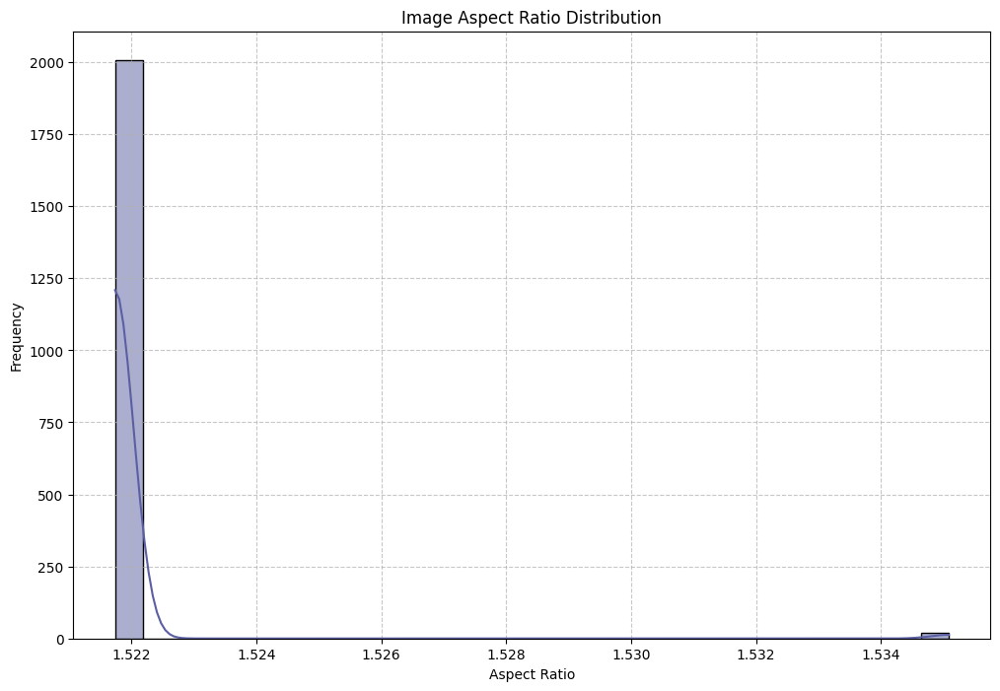

In [33]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

# Function to plot aspect ratio distribution
def plot_aspect_ratio_distribution(df_data):
    # Compute aspect ratios
    aspect_ratios = df_data['Width'] / df_data['Height']

    plt.figure(figsize=(12, 8))
    sns.histplot(aspect_ratios, kde=True, color='#5a5ea3', bins=30)
    plt.xlabel('Aspect Ratio')
    plt.ylabel('Frequency')
    plt.title('Image Aspect Ratio Distribution')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()

# Assuming df_data is your DataFrame
plot_aspect_ratio_distribution(df_data)


Aspect ratio distribution checks the proportion of an image’s width to its height, revealing the general shape and format of the images. In your dataset, the distribution shows that most images have an aspect ratio of approximately 1.522, indicating that they are predominantly rectangular with width slightly larger than height. There are a few images with an aspect ratio of 1.535, which are less common. This highlights that while the majority of images have a consistent rectangular format, there are some variations.

**DATA PREPROCESSING**

In [34]:
import os
import numpy as np
import pandas as pd
import cv2
from sklearn.model_selection import train_test_split, StratifiedKFold
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
from sklearn.utils.class_weight import compute_class_weight

Resizing and normalizing the data

In [35]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import cv2
import numpy as np

image_size = (256, 256)  # Uniform size to which images will be resized
batch_size = 64

# Create an ImageDataGenerator for augmentation
datagen = ImageDataGenerator(
    rescale=1./255,  # Normalize pixel values to [0, 1]
    rotation_range=20,  # Randomly rotate images in the range (degrees, 0 to 180)
    width_shift_range=0.2,  # Randomly translate images horizontally (fraction of total width)
    height_shift_range=0.2,  # Randomly translate images vertically (fraction of total height)
    shear_range=0.2,  # Shear intensity (shear angle in counter-clockwise direction in degrees)
    zoom_range=0.2,  # Randomly zoom into images
    horizontal_flip=True,  # Randomly flip images horizontally
    fill_mode='nearest'  # Fill mode for points outside the boundaries of the input
)

# Helper function to resize, normalize, and augment images
def process_and_augment_images(subfolder_path, augment=False):
    images = []
    for image_name in os.listdir(subfolder_path):
        image_path = os.path.join(subfolder_path, image_name)
        try:
            # Read and resize image
            img = cv2.imread(image_path)
            img = cv2.resize(img, image_size)
            img = np.expand_dims(img, axis=0)  # Add batch dimension

            if augment:
                # Augment image only if required
                img_augmented = datagen.flow(img, batch_size=1)
                images.append(img_augmented[0][0])  # Remove batch dimension after augmentation
            else:
                images.append(img[0])  # Keep the original image if no augmentation is needed

        except Exception as e:
            print(f'Issue with image {image_path}: {e}')
    return np.array(images)

# Process benign subfolders without augmentation
benign_subfolders = ['tubular_adenoma', 'fibroadenoma', 'adenosis', 'phyllodes_tumor']
benign_images = []
for subfolder in benign_subfolders:
    subfolder_path = os.path.join(data_dir, 'benign', subfolder)
    benign_images.append(process_and_augment_images(subfolder_path, augment=False))
    print(f'Processed benign/{subfolder}: {len(benign_images[-1])} images')

# Process malignant subfolders with augmentation
malignant_subfolders = ['papillary_carcinoma', 'mucinous_carcinoma', 'lobular_carcinoma', 'ductal_carcinoma']
malignant_images = []
for subfolder in malignant_subfolders:
    subfolder_path = os.path.join(data_dir, 'malignant', subfolder)
    malignant_images.append(process_and_augment_images(subfolder_path, augment=True))
    print(f'Processed malignant/{subfolder}: {len(malignant_images[-1])} images')

# Concatenate all images into single numpy arrays
benign_images = np.concatenate(benign_images, axis=0)
malignant_images = np.concatenate(malignant_images, axis=0)

# Combine benign and malignant images into a balanced dataset
X = np.concatenate([benign_images, malignant_images], axis=0)
y = np.array([0] * len(benign_images) + [1] * len(malignant_images))

# Shuffle the dataset
shuffled_indices = np.random.permutation(len(X))
X = X[shuffled_indices]
y = y[shuffled_indices]

Processed benign/tubular_adenoma: 117 images
Processed benign/fibroadenoma: 260 images
Processed benign/adenosis: 113 images
Processed benign/phyllodes_tumor: 121 images
Processed malignant/papillary_carcinoma: 142 images
Processed malignant/mucinous_carcinoma: 222 images
Processed malignant/lobular_carcinoma: 170 images
Processed malignant/ductal_carcinoma: 883 images


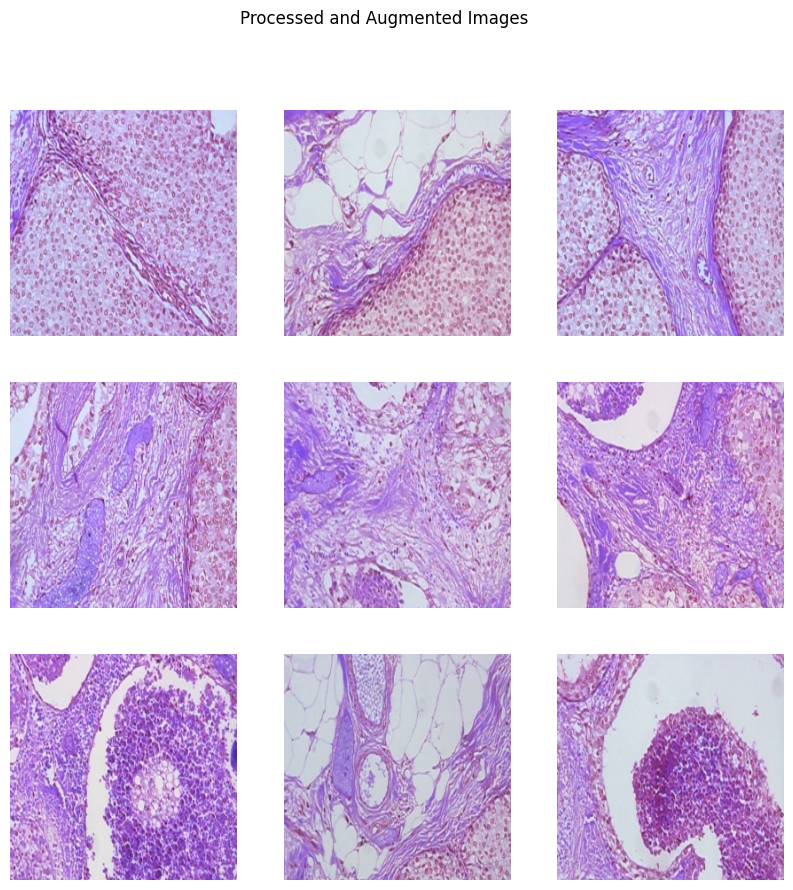

In [36]:
processed_images = process_and_augment_images(subfolder_path)

def show_images(images, title):
    plt.figure(figsize=(10, 10))
    for i in range(min(9, len(images))):
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])
        plt.axis('off')
    plt.suptitle(title)
    plt.show()

show_images(processed_images, 'Processed and Augmented Images')

In [37]:
data_dir = tf.keras.utils.image_dataset_from_directory(data_dir) #Builds image dataset

Found 2028 files belonging to 2 classes.


In [38]:
data_iterator= data_dir.as_numpy_iterator() #Converts data to numpy array to enable iteration thruogh the data

In [39]:
batch = data_iterator.next() #Gets the next batch of data. Allows access to the data

In [40]:
#images represented as a numpy array
batch[0].shape #Gets the shape of the first element in the batch

(32, 256, 256, 3)

In [41]:
batch[1]

array([0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0,
       1, 0, 1, 1, 1, 0, 1, 1, 1, 1], dtype=int32)

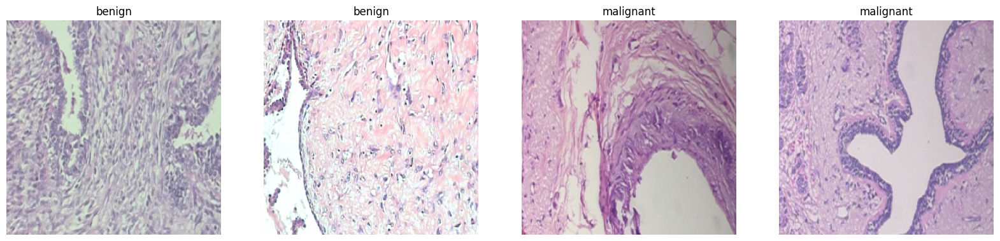

In [42]:
# Define class labels
class_labels = {0: 'benign', 1: 'malignant'}

# Create a plot with 4 subplots
fig, ax = plt.subplots(ncols=4, figsize=(20, 20))

# Plot images with tags
for idx, img in enumerate(batch[0][:4]):
    ax[idx].imshow(img.astype(int))
    ax[idx].title.set_text(class_labels[batch[1][idx]])

# Hide axes
for a in ax:
    a.axis('off')

plt.show()

Scale the data

In [43]:
scaled_dir = data_dir.map(lambda x,y: (x/255, y))

In [44]:
scaled_iterator = scaled_dir.as_numpy_iterator()

In [45]:
batch =scaled_iterator.next()
batch

(array([[[[0.97060376, 0.6524428 , 0.85001963],
          [0.9903076 , 0.6441569 , 0.95620716],
          [0.9869751 , 0.6327778 , 0.958268  ],
          ...,
          [0.980188  , 0.48202023, 0.76983476],
          [0.9856079 , 0.4360969 , 0.7452783 ],
          [0.9597345 , 0.4649359 , 0.77456295]],
 
         [[0.99535054, 0.69615334, 0.94943154],
          [0.91360533, 0.522892  , 0.8273921 ],
          [0.91261655, 0.50793505, 0.8268751 ],
          ...,
          [0.9366053 , 0.45988387, 0.76844984],
          [0.96837395, 0.48604688, 0.79342806],
          [0.9459351 , 0.5816066 , 0.8577831 ]],
 
         [[0.9525757 , 0.60705066, 0.88565767],
          [0.83911157, 0.438315  , 0.746532  ],
          [0.88106596, 0.4797282 , 0.78825516],
          ...,
          [0.9999897 , 0.71528727, 0.98877597],
          [0.999871  , 0.71335137, 0.96855974],
          [1.        , 0.7500551 , 0.9998406 ]],
 
         ...,
 
         [[1.        , 0.55314344, 0.76987547],
          [0.99844

Batch the Data

In [46]:
batch[0].min() #Displays the lowest element in the batch

0.0017140108

In [47]:
batch[0].max() #Dislays the highest element in the batch

1.0

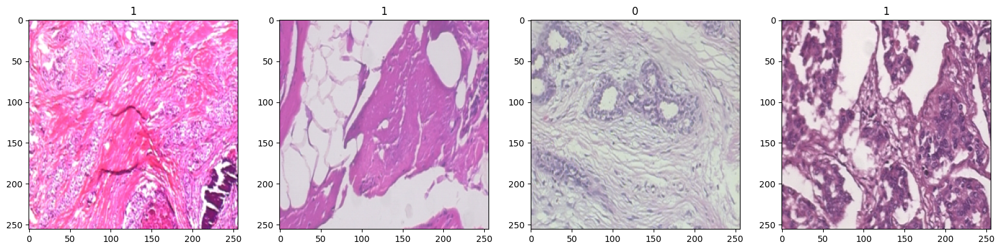

In [48]:
#plot the image tags from the batch sample
#Class 1 = Benign
#Class2 = Malignant
fig, ax = plt.subplots(ncols=4, figsize=(20,20))
for idx, img in enumerate(batch[0][:4]):
    ax[idx].imshow(img)
    ax[idx].title.set_text(batch[1][idx])

Split the data

In [49]:
len(scaled_dir)

64

In [50]:
train_size = int(len(scaled_dir)*.7)
val_size = int(len(scaled_dir)*.2)+1
test_size = int(len(scaled_dir)*.1)+1

In [51]:
train_size + val_size + test_size

64

In [52]:
train= data_dir.take(train_size)
val= data_dir.skip(train_size).take(val_size)
test= data_dir.skip(train_size+val_size).take(test_size)

In [53]:
len(val)

13

**DEEP MODELLING**

**Model 1: CNN**

In [54]:
from sklearn.model_selection import train_test_split, StratifiedKFold
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
from sklearn.utils.class_weight import compute_class_weight

In [56]:
from tensorflow.keras import layers, models

def create_model_with_dropout():
    model = models.Sequential([
        layers.Conv2D(32, (3, 3), activation='relu', input_shape=(256, 256, 3)),
        layers.MaxPooling2D((2, 2)),
        layers.Conv2D(64, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),
        layers.Conv2D(128, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),
        layers.Flatten(),
        layers.Dropout(0.2),  # Dropout layer added
        layers.Dense(512, activation='relu'),
        layers.Dense(1, activation='sigmoid')
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model
# Create an instance of the model
model = create_model_with_dropout()



/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [57]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 254, 254, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 127, 127, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 125, 125, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 62, 62, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 60, 60, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 30, 30, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 115200)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 115200)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │      58,982,912 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 59,076,673 (225.36 MB)

 Trainable params: 59,076,673 (225.36 MB)

 Non-trainable params: 0 (0.00 B)

**Train the model**

In [58]:
import numpy as np
from sklearn.utils import class_weight

# Extract labels from the training dataset
train_labels = []
for images, labels in train:
    train_labels.extend(labels.numpy())

# Compute class weights
class_weights = class_weight.compute_class_weight(
    'balanced',
    classes=np.unique(train_labels),
    y=train_labels
)

# Convert class weights to a dictionary format
class_weights_dict = dict(enumerate(class_weights))

In [59]:
logdir = 'logs'

In [60]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)

In [61]:
# Train the model with class weights
hist = model.fit(
    train,
    epochs=20,
    validation_data=val,
    class_weight=class_weights_dict,  # Use computed class weights
    callbacks=[tensorboard_callback]
)

Epoch 1/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 332s 7s/step - accuracy: 0.5428 - loss: 342.7031 - val_accuracy: 0.8413 - val_loss: 0.4735
Epoch 2/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 401s 8s/step - accuracy: 0.6905 - loss: 0.7590 - val_accuracy: 0.8173 - val_loss: 0.4667
Epoch 3/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 350s 7s/step - accuracy: 0.7921 - loss: 0.4953 - val_accuracy: 0.8534 - val_loss: 0.3666
Epoch 4/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 318s 7s/step - accuracy: 0.8156 - loss: 0.4470 - val_accuracy: 0.8269 - val_loss: 0.4306
Epoch 5/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 355s 8s/step - accuracy: 0.8245 - loss: 0.4185 - val_accuracy: 0.8798 - val_loss: 0.3529
Epoch 6/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 377s 8s/step - accuracy: 0.8421 - loss: 0.4100 - val_accuracy: 0.8293 - val_loss: 0.4240
Epoch 7/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 348s 7s/step - accuracy: 0.8634 - loss: 0.3273 - val_accuracy: 0.8654 - val_loss: 0.3332
Epoch 8/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 327s 7s/step - accuracy: 0.8954 - loss: 0.2845 - val_accuracy: 0.8774 -

**Plot Model Performance**

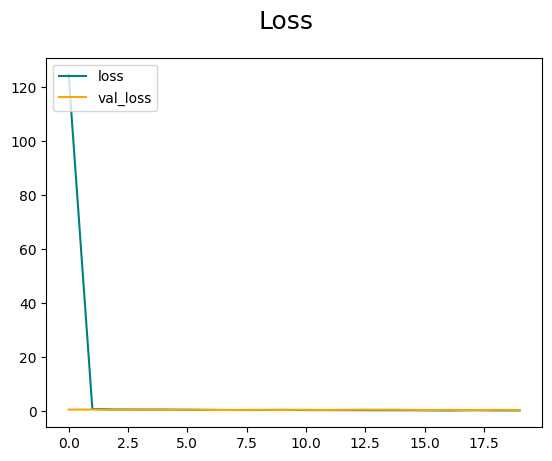

In [63]:
fig = plt.figure()
plt.plot(hist.history['loss'], color='teal', label='loss')
plt.plot(hist.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize= 18)
plt.legend(loc="upper left")
plt.show()

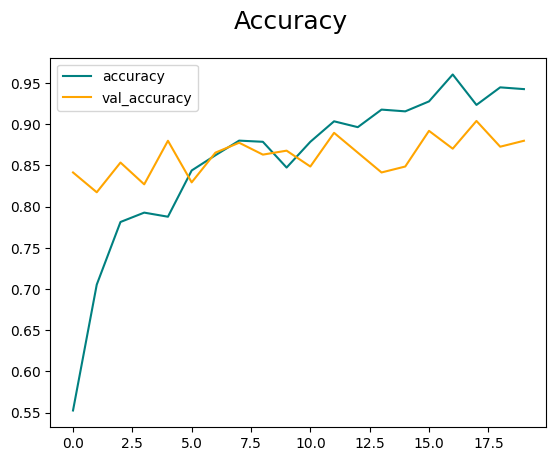

In [64]:
fig = plt.figure()
plt.plot(hist.history['accuracy'], color='teal', label='accuracy')
plt.plot(hist.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize= 18)
plt.legend(loc="upper left")
plt.show()

**Evaluate Performance**

Evaluate

In [65]:
from tensorflow.keras.metrics import Precision, Recall, BinaryAccuracy

In [66]:
pre = Precision()
re = Recall()
acc = BinaryAccuracy()


In [67]:
for batch in test.as_numpy_iterator():
    X, y = batch
    yhat = model.predict(X)
    pre.update_state(y, yhat)
    re.update_state(y, yhat)
    acc.update_state(y, yhat)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 964ms/step


In [68]:
print(f'Precision: {pre.result().numpy()}, Recall: {re.result().numpy()}, Accuracy: {acc.result().numpy()}')

Precision: 0.9025974273681641, Recall: 0.9205297827720642, Accuracy: 0.8676470518112183


Precision: 0.9026: This indicates that approximately 90.26% of the cases predicted as positive (malignant) are actually positive. This is a strong precision score, suggesting that the model is very good at avoiding false positives.High precision indicates that when your model predicts a positive class, it is usually correct.

Recall: 0.9205: This indicates that the model correctly identifies about 92.05% of the actual positive cases. While this is a decent recall, it suggests that the model misses about 7.95% of the positive cases.High recall shows that your model is effective at capturing most of the positive cases.

Accuracy: 0.8676: This means that the model correctly classifies about 86.76% of all cases. The model performs well overall, correctly classifying about 86.76% of all cases.

ROC curve

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


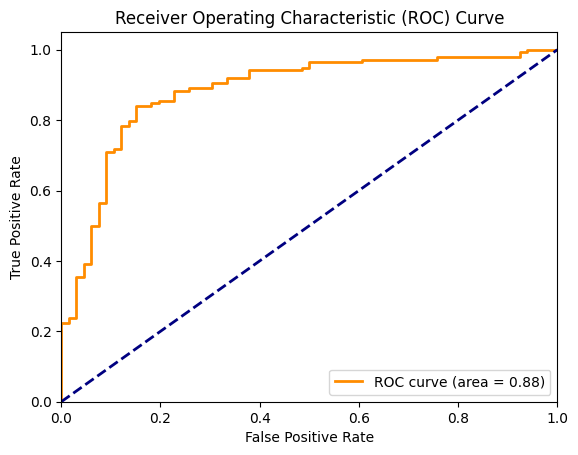

AUC-ROC: 0.8832


In [69]:
from sklearn.metrics import roc_curve, auc
# Evaluate the model on the test set
y_true = []
y_pred = []

for images, labels in test:
    preds = model.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(preds.flatten())

y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Compute ROC curve and ROC area
fpr, tpr, _ = roc_curve(y_true, y_pred)
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

print(f'AUC-ROC: {roc_auc:.4f}')

The ROC curve is closer to the top-left corner, indicating that the model's performance is good. This means a high TPR (sensitivity) with a low FPR, indicating that the model can correctly identify most positive cases with few false positives.

The area under the ROC curve (AUC-ROC) is a single scalar value that summarizes the model's performance across all threshold settings. The model's ROC curve area is 0.88 which falls between 0.8 ≤ AUC < 0.9, indicating Good performance.

The steep initial slope in the ROC curve indicates that the model achieves high sensitivity with a low increase in FPR, which is desirable.

Confusion Matrix

In [70]:
import numpy as np

y_true = []
y_pred = []

for images, labels in test:
    predictions = model.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(predictions, axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


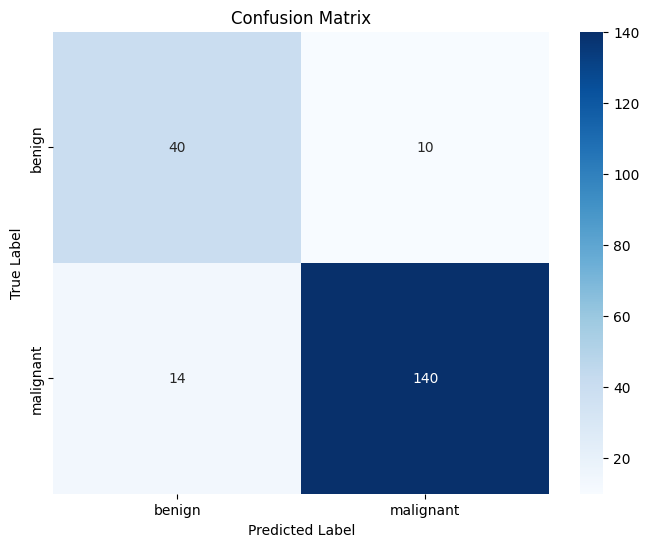

Confusion Matrix:
[[ 40  10]
 [ 14 140]]


In [71]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming test_dataset is already defined and the model is trained

# Define class labels
class_labels = {0: 'benign', 1: 'malignant'}

# Get the true labels and predicted labels
y_true = []
y_pred = []

for images, labels in test:
    y_true.append(labels.numpy())
    predictions = model.predict(images)
    y_pred.append(np.round(predictions).astype(int))  # Convert probabilities to 0 or 1

y_true = np.concatenate(y_true)
y_pred = np.concatenate(y_pred).ravel()

# Compute the confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels.values(), yticklabels=class_labels.values())
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

# Optionally, print the confusion matrix with labels
print("Confusion Matrix:")
print(cm)

Interpretation:

True Positives (TP = 140): The model correctly identified 140 positive instances.

True Negatives (TN = 40): The model correctly identified 40 negative instances.

False Positives (FP = 10): There were 10 instances where the model incorrectly identified a negative instance as positive.

False Negatives (FN = 14): There were 14 instances where the model incorrectly identified a positive instance as negative.

Summary:

Strengths: The model has a high number of true positives (140) compared to false positives (10), which aligns with the high precision reported.

The model has a high Precision (93.33%) and Recall (90.91%), which suggests it is effective at identifying positive cases with relatively few false positives and false negatives.

The overall Accuracy (90%) is also strong, indicating that the model performs well across both classes.

These results suggest that your model is reliable in identifying the positive class, which is crucial for tasks like breast cancer detection.

Test

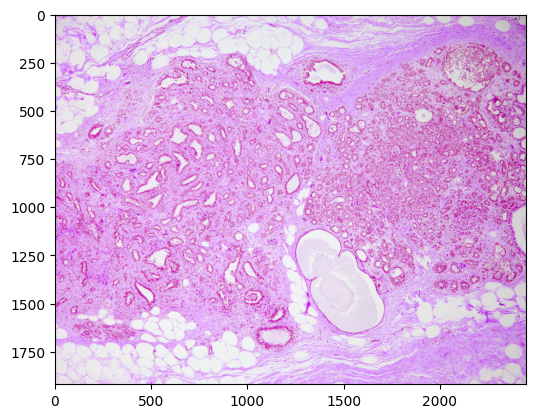

In [128]:
img = cv2.imread('/content/benign_test3.jpg')
plt.imshow(img)
plt.show()

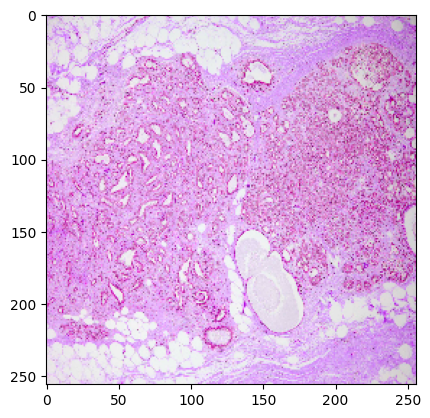

In [129]:
resize = tf.image.resize(img, (256,256))
plt.imshow(resize.numpy().astype(int))
plt.show()

In [130]:
np.expand_dims(resize,0)

array([[[[194.29688, 111.75781, 226.30469],
         [196.25   , 137.22656, 223.07812],
         [213.47656, 169.97656, 228.28906],
         ...,
         [179.73438, 174.73438, 175.73438],
         [176.     , 173.     , 168.     ],
         [174.     , 168.     , 173.     ]],

        [[213.75   , 175.32031, 238.10938],
         [197.02344, 151.91406, 212.79688],
         [203.8125 , 147.71094, 243.01562],
         ...,
         [179.52344, 174.52344, 175.52344],
         [176.     , 173.     , 168.     ],
         [171.5    , 165.5    , 170.5    ]],

        [[210.78906, 197.71094, 223.     ],
         [205.3125 , 201.0625 , 219.8125 ],
         [199.4375 , 164.28125, 208.60156],
         ...,
         [180.     , 175.     , 176.     ],
         [178.     , 172.     , 177.     ],
         [175.78906, 169.78906, 174.78906]],

        ...,

        [[232.     , 226.     , 231.     ],
         [232.     , 226.     , 231.     ],
         [221.19531, 208.44531, 231.94531],
         ...,


In [131]:
yhat = model.predict(np.expand_dims(resize/255, 0))
yhat

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


array([[0.49480006]], dtype=float32)

In [132]:
#Our class lables were: class_labels = {0: 'benign', 1: 'malignant'}
if yhat > 0.5:
    print(f'Predicted class is {class_labels[1]}')
else:
    print(f'Predicted class is {class_labels[0]}')


Predicted class is benign


Our model has successfully classified the benign image

Save the Model

In [134]:
#from tensorflow.keras.models import load_model
#model.save(os.path.join('models','br_cr_imageclassifier.h5'))

**Model  2: RESNET**

In [135]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

In [136]:
# Data augmentation and preprocessing
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip('horizontal'),
    layers.RandomRotation(0.2),
])


In [137]:
# Load ResNet50 model pre-trained on ImageNet
base_model = ResNet50(input_shape=(256, 256, 3), include_top=False, weights='imagenet')
base_model.trainable = False  # Freeze the base model


In [138]:
# Create the model
def create_model():
    model2 = models.Sequential([
    data_augmentation,
    layers.Rescaling(1./255),  # Normalize the images to [0, 1]
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.2),
    layers.Dense(1, activation='sigmoid')  # Assuming binary classification
])
    return model
# Create an instance of the model
model2 = create_model()

In [139]:
# Compile the model
model2.compile(optimizer=Adam(),
              loss='binary_crossentropy',
              metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall()])


In [140]:
model2.summary()

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ sequential_7 (Sequential)            │ (1, 256, 256, 3)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ rescaling_5 (Rescaling)              │ (1, 256, 256, 3)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ resnet50 (Functional)                │ (1, 8, 8, 2048)             │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_5           │ (1, 2048)                   │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (1, 256)                    │         524,544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (1, 256)                    │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ (1, 1)                      │             257 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,112,513 (91.98 MB)

 Trainable params: 524,801 (2.00 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [142]:
# Train the model
history = model2.fit(
    train,
    validation_data=val,
    epochs=20
)


Epoch 1/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 506s 11s/step - accuracy: 0.6104 - loss: 0.7298 - precision_4: 0.6849 - recall_4: 0.7929 - val_accuracy: 0.7332 - val_loss: 0.5907 - val_precision_4: 0.7259 - val_recall_4: 1.0000
Epoch 2/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 522s 12s/step - accuracy: 0.7008 - loss: 0.6307 - precision_4: 0.7046 - recall_4: 0.9759 - val_accuracy: 0.7500 - val_loss: 0.5579 - val_precision_4: 0.7438 - val_recall_4: 1.0000
Epoch 3/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 493s 11s/step - accuracy: 0.6967 - loss: 0.6186 - precision_4: 0.6937 - recall_4: 0.9962 - val_accuracy: 0.7236 - val_loss: 0.5750 - val_precision_4: 0.7153 - val_recall_4: 1.0000
Epoch 4/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 492s 11s/step - accuracy: 0.7224 - loss: 0.6003 - precision_4: 0.7150 - recall_4: 0.9949 - val_accuracy: 0.7308 - val_loss: 0.5725 - val_precision_4: 0.7280 - val_recall_4: 0.9863
Epoch 5/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 488s 11s/step - accuracy: 0.7012 - loss: 0.6044 - precision_4: 0.7054 - recall_4: 0.9704 -

**Evaluate the ResNet model**

In [143]:
# Evaluate the model
test_loss, test_accuracy, test_precision, test_recall = model2.evaluate(test)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_precision:.4f}')
print(f'Test Recall: {test_recall:.4f}')


7/7 ━━━━━━━━━━━━━━━━━━━━ 81s 6s/step - accuracy: 0.7181 - loss: 0.5818 - precision_4: 0.7152 - recall_4: 0.9805
Test Accuracy: 0.7255
Test Precision: 0.7254
Test Recall: 0.9790


ResNet ROC curve

1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


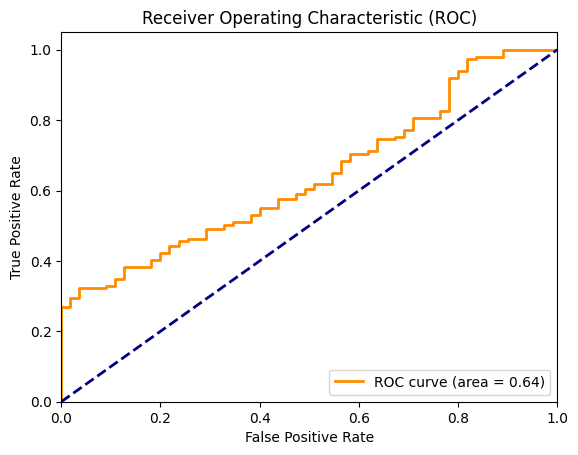

AUC-ROC: 0.6401


In [144]:
train= data_dir.take(train_size)
val= data_dir.skip(train_size).take(val_size)
test= data_dir.skip(train_size+val_size).take(test_size)

# Get the true labels and predicted probabilities
y_true = []
y_pred = []

for images, labels in test:
    y_true.append(labels.numpy())
    y_pred.append(model2.predict(images))

y_true = np.concatenate(y_true)
y_pred = np.concatenate(y_pred).ravel()  # Flatten the predictions

# Compute the ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_true, y_pred)
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()

# Print the AUC value
print(f'AUC-ROC: {roc_auc:.4f}')

ResNet AUC-ROC = 0.6401:

0.6401 is above 0.5, indicating that the ResNet model has some ability to distinguish between benign and malignant cases.
Moderate Performance: An AUC of 0.6401 suggests that the model is moderately better than random guessing but still has significant room for improvement. In medical applications like breast cancer classification, higher AUC values (closer to 1) are typically desired because they indicate more reliable and accurate predictions.


**ResNet Confusion Matrix**

1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


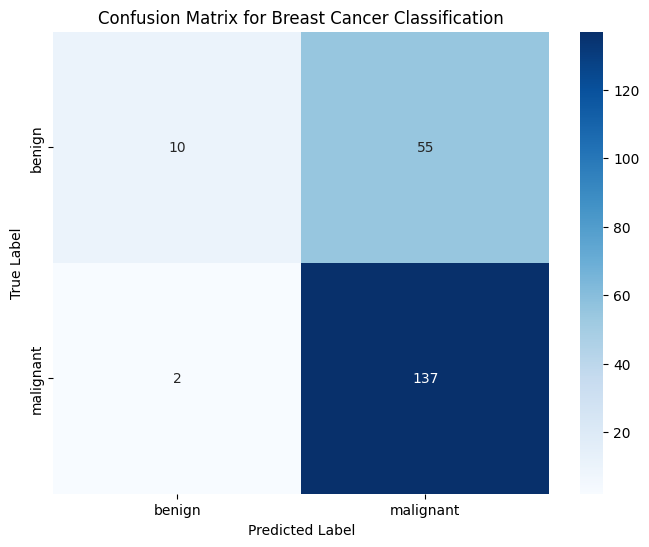

Confusion Matrix:
[[ 10  55]
 [  2 137]]


In [146]:
from sklearn.metrics import confusion_matrix


# Define class labels
class_labels = {0: 'benign', 1: 'malignant'}

# Get the true labels and predicted labels
y_true = []
y_pred = []

for images, labels in test:
    y_true.append(labels.numpy())
    predictions = model2.predict(images)
    y_pred.append(np.round(predictions).astype(int))  # Convert probabilities to 0 or 1

y_true = np.concatenate(y_true)
y_pred = np.concatenate(y_pred).ravel()

# Compute the confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels.values(), yticklabels=class_labels.values())
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix for Breast Cancer Classification')
plt.show()

# Optionally, print the confusion matrix with labels
print("Confusion Matrix:")
print(cm)

True Negatives (TN) = 10:

These are the cases where the model correctly predicted benign when the actual label was benign.
Interpretation: The model correctly identified 10 benign cases.
False Positives (FP) = 55:

These are the cases where the model incorrectly predicted malignant when the actual label was benign.
Interpretation: The model incorrectly classified 55 benign cases as malignant.
False Negatives (FN) = 2:

These are the cases where the model incorrectly predicted benign when the actual label was malignant.
Interpretation: The model incorrectly classified 2 malignant cases as benign, which is concerning in medical contexts since missing a malignant case is a critical error.
True Positives (TP) = 137:

These are the cases where the model correctly predicted malignant when the actual label was malignant.
Interpretation: The model correctly identified 137 malignant cases.

Overall Interpretation:
Strength: The model is very good at identifying malignant cases (high recall of 98.56%).

Weakness: The model struggles to correctly identify benign cases, as indicated by the high number of false positives (55 FP) and low specificity (15.38%).

Implication: While the model is effective at catching most malignant cases, it has a high rate of false positives, meaning it may cause unnecessary alarm by incorrectly labeling benign cases as malignant. This can lead to overdiagnosis and unnecessary further testing or treatment.

**Tuned Resnet Model with Wandb**

In [3]:
!pip install wandb


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 77.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 19.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 301.8/301.8 kB 25.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 5.7 MB/s eta 0:00:00


In [4]:
import wandb
from tensorflow.keras import layers, models
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.optimizers import Adam


In [ ]:
# Initialize WandB project
wandb.init(project="breast-cancer-classification", entity="https://wandb.ai/amina-saidi-moringa-school/breast-cancer-classification")

In [ ]:
# Define the dataset splits
train_dataset = data_dir.take(train_size)
val_dataset = data_dir.skip(train_size).take(val_size)
test_dataset = data_dir.skip(train_size + val_size).take(test_size)


In [ ]:
# Data augmentation and preprocessing
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip('horizontal'),
    layers.RandomRotation(0.2),
])

In [ ]:
# Load ResNet50 model pre-trained on ImageNet
base_model = ResNet50(input_shape=(224, 224, 3), include_top=False, weights='imagenet')
base_model.trainable = False  # Initially freeze the base model

In [ ]:
# Create the model
model3 = models.Sequential([
    data_augmentation,
    layers.Rescaling(1./255),  # Normalize the images to [0, 1]
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')  # Assuming binary classification
])

# Compile the model
model3.compile(optimizer=Adam(),
              loss='binary_crossentropy',
              metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall()])

In [ ]:
model3.summary()

In [ ]:
# Function to log metrics to WandB
def log_metrics(history, epoch):
    metrics = {}
    for metric_name in history.history:
        metrics[metric_name] = history.history[metric_name][-1]  # Get the last recorded value for each metric
    wandb.log(metrics, step=epoch)

# Start fine-tuning after initial training
def fine_tune_model(model, base_model, train_dataset, val_dataset):
    # Unfreeze the base model
    base_model.trainable = True

    # Compile the model with a lower learning rate for fine-tuning
    model.compile(optimizer=Adam(1e-5),  # Lower learning rate
                  loss='binary_crossentropy',
                  metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall()])

    # Fine-tuning the model and logging metrics manually
    fine_tune_epochs = 10  # Adjust as needed
    for epoch in range(fine_tune_epochs):
        history = model.fit(train_dataset, validation_data=val_dataset, epochs=1)
        log_metrics(history, initial_epochs + epoch)

    return history


In [ ]:
# Train the model and log metrics manually
initial_epochs = 5  # Train the top layers first
for epoch in range(initial_epochs):
    history = model.fit(train_dataset, validation_data=val_dataset, epochs=1)
    log_metrics(history, epoch)

In [ ]:
# Fine-tune the model
fine_tune_model(model, base_model, train_dataset, val_dataset)

In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy, test_precision, test_recall = model.evaluate(test_dataset)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_precision:.4f}')
print(f'Test Recall: {test_recall:.4f}')

In [ ]:
# Log the final test metrics to WandB
wandb.log({
    "test_loss": test_loss,
    "test_accuracy": test_accuracy,
    "test_precision": test_precision,
    "test_recall": test_recall
})

In [ ]:
# Finish WandB run
wandb.finish()